In [2]:
#!/usr/bin/env python3
#pip install  rioxarray==0.3.1
import pandas as pd
import xarray as xr
import matplotlib.pyplot as plt
import rioxarray
import numpy as np
import geopandas as gpd
import cartopy.crs as ccrs
import rasterio
import os
import matplotlib.colors
scriptsdir = os.getcwd()
from scipy.interpolate import griddata
from functools import reduce
import xarray
import itertools
import matplotlib.colors as mcolors
import matplotlib.colors as colors
from matplotlib.colors import ListedColormap, BoundaryNorm
import matplotlib.gridspec as gridspec
import cartopy.feature as cfeature
import warnings

In [1]:
!pip uninstall -y regionmask

Found existing installation: regionmask 0.9.0
Uninstalling regionmask-0.9.0:
  Successfully uninstalled regionmask-0.9.0


In [3]:
pip install shapely==1.5.13

Defaulting to user installation because normal site-packages is not writeable
  Using cached Shapely-1.5.13-py3-none-any.whl
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
regionmask 0.9.0 requires shapely>=1.7, but you have shapely 1.5.13 which is incompatible.
geopandas 0.12.2 requires shapely>=1.7, but you have shapely 1.5.13 which is incompatible.
cartopy 0.21.1 requires shapely>=1.6.4, but you have shapely 1.5.13 which is incompatible.

[notice] A new release of pip is available: 23.0.1 -> 23.2
[notice] To update, run: pip install --upgrade pip
Note: you may need to restart the kernel to use updated packages.


In [2]:
!pip uninstall -y shapely

Found existing installation: shapely 2.0.1
Uninstalling shapely-2.0.1:
  Successfully uninstalled shapely-2.0.1


### Global maps showing future-past species richness

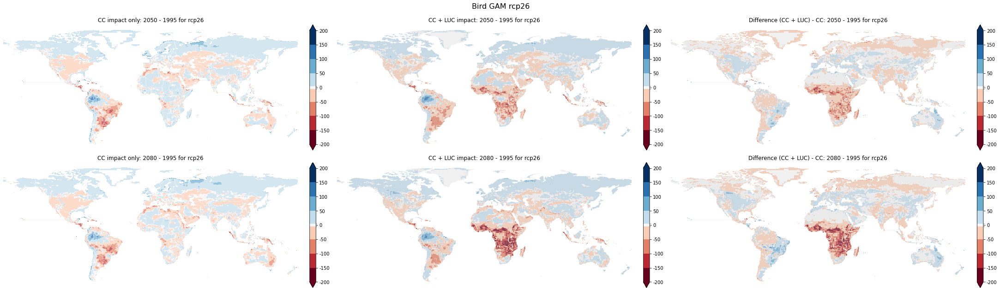

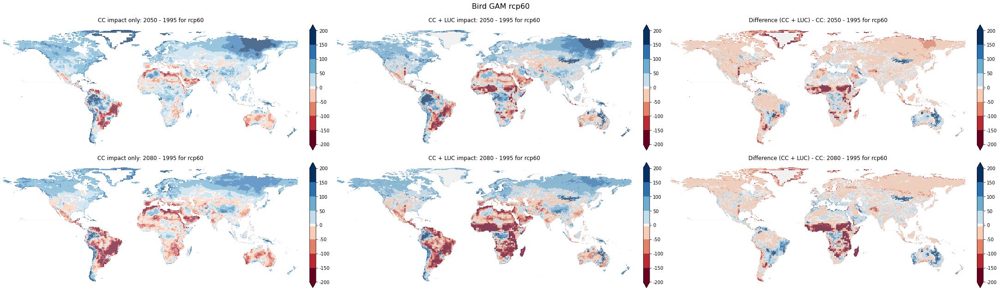

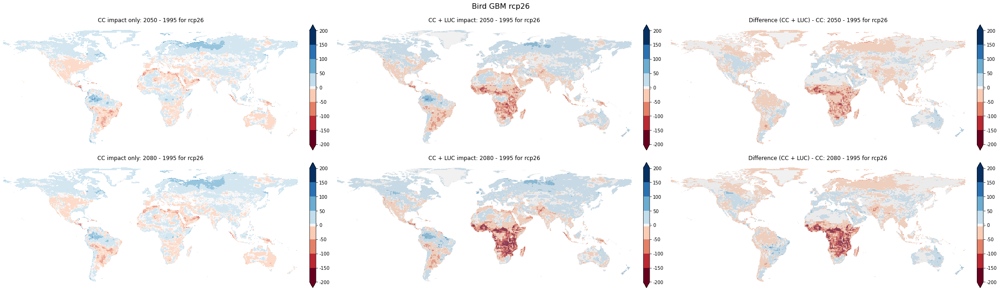

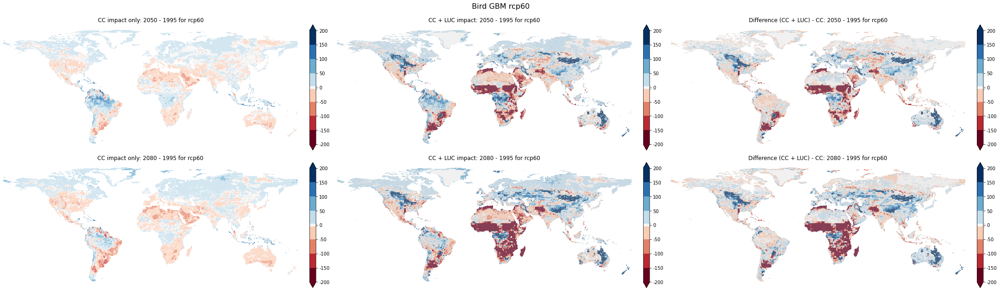

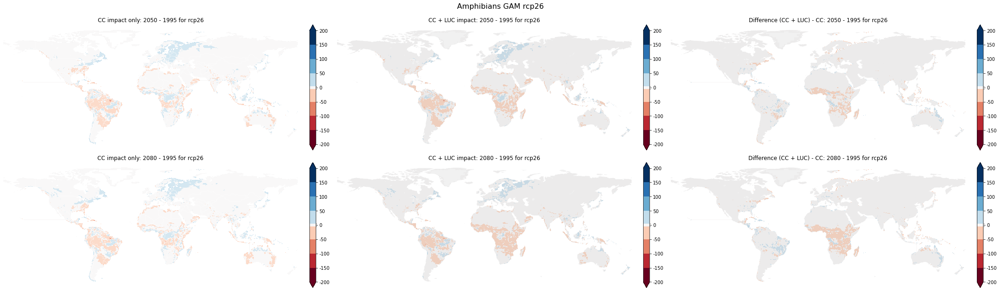

...

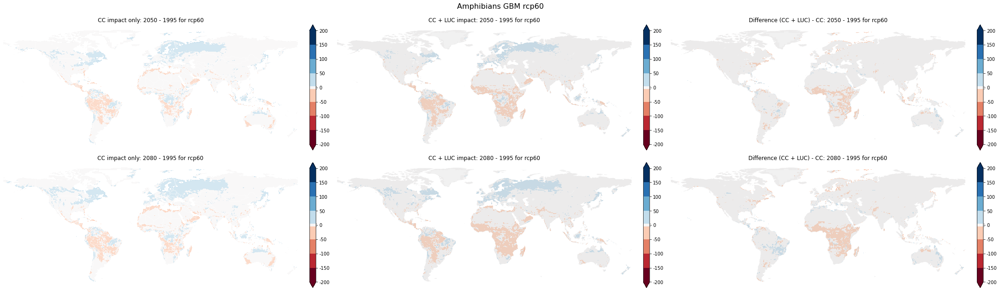

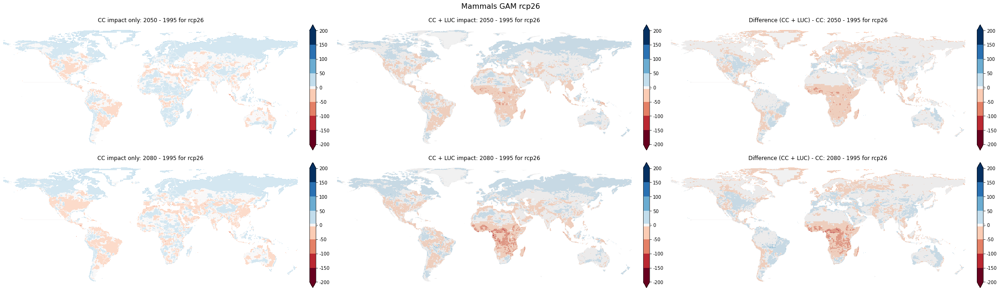

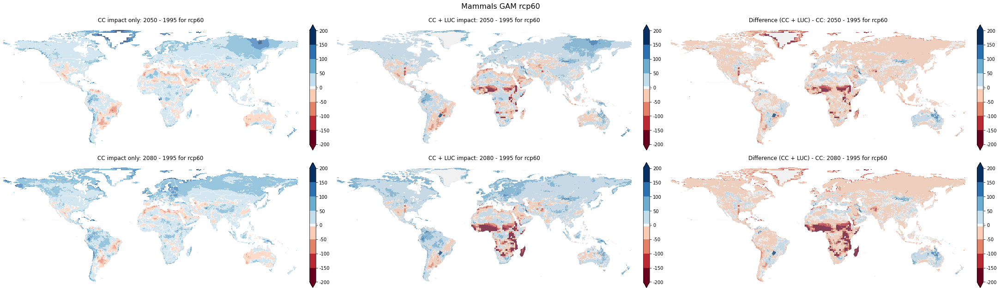

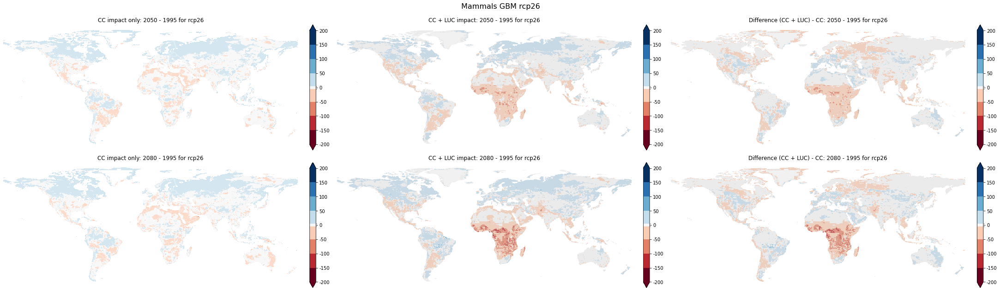

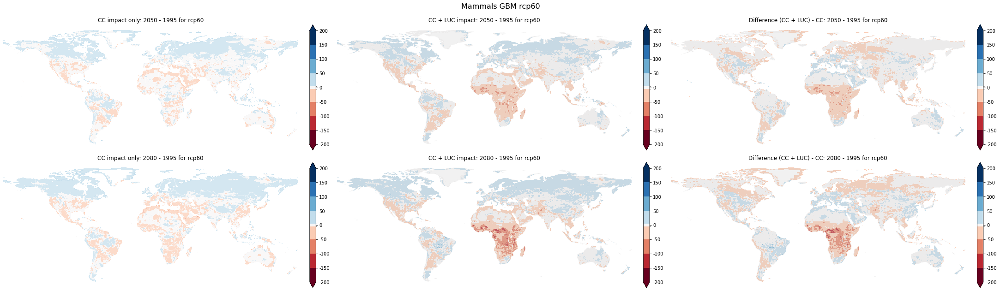

In [3]:
### SDM MODEL SDMs separately  ##### 

warnings.filterwarnings('ignore', category=UserWarning)

models = ["GAM","GBM"]
taxas = ["Bird","Amphibians","Mammals"]
scenarios = ["rcp26","rcp60"]


countries = gpd.read_file(
              gpd.datasets.get_path("naturalearth_lowres"))

#newvalue
for taxa in taxas:
    for model in models:
        for scenario in scenarios:
            historical_time = 1146
            future_times = [35, 65]
            model_names = [ 'GFDL-ESM2M','IPSL-CM5A-LR', 'HadGEM2-ES', 'MIROC5']
            netcdf_path_format_future = "/storage/scratch/users/ch21o450/data/LandClim_Output/{}/{}/{}/{}/{}_[{}].nc"
            netcdf_path_format_hist = "/storage/scratch/users/ch21o450/data/LandClim_Output/{}/{}/EWEMBI/{}_[{}].nc"

            fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(30, 15), subplot_kw={'projection': ccrs.PlateCarree()}, layout="compressed")


            plot_idx = 0
            year_indices = {1146: '1995', 35: '2050', 65: '2080', 85: '2100'}
            for future_time in future_times:


                newvalue_hist = f"/storage/homefs/ch21o450/scripts/BioScenComb/intermediate_results/{taxa}_{model}_{historical_time}_{scenario}_species_count_per_SCDM_00th_mean_value_bin_future.nc"

                sumbin_hist = f"/storage/homefs/ch21o450/scripts/BioScenComb/intermediate_results/{taxa}_{model}_{historical_time}_{scenario}_species_count_per_SCDM_00th_mean_sum_bin_future.nc"


                mean_value_bin_hist = xr.open_dataset(newvalue_hist,decode_times=False).to_array()
                mean_sum_bin_hist = xr.open_dataset(sumbin_hist,decode_times=False).to_array()
                #mean_value_bin_hist = mean_value_bin_hist.isel(variable=0)
                #mean_sum_bin_hist = mean_sum_bin_hist.isel(variable=0)

                newvalue_fut = f"/storage/homefs/ch21o450/scripts/BioScenComb/intermediate_results/{taxa}_{model}_{future_time}_{scenario}_species_count_per_SCDM_00th_mean_value_bin_future.nc"

                sumbin_fut = f"/storage/homefs/ch21o450/scripts/BioScenComb/intermediate_results/{taxa}_{model}_{future_time}_{scenario}_species_count_per_SCDM_00th_mean_sum_bin_future.nc"

                mean_value_bin_future = xr.open_dataset(newvalue_fut,decode_times=False).to_array()
                mean_sum_bin_future = xr.open_dataset(sumbin_fut,decode_times=False).to_array()
                mean_sum_bin_future = mean_sum_bin_future.isel(variable=0)

                # Calculate the differences
                diff_value_bin = mean_value_bin_future - mean_value_bin_hist
                diff_sum_bin = mean_sum_bin_future - mean_sum_bin_hist
                diff = diff_sum_bin - diff_value_bin

                diff_value_bin_ensemble = diff_value_bin.isel(variable=0)
                diff_sum_bin_ensemble = diff_sum_bin.isel(variable=0)
                diff_ensemble = diff_sum_bin_ensemble - diff_value_bin_ensemble

                # Create three subplots for each future time and scenario
                if plot_idx >= len(axes.flatten()):
                    break
                ax1 = axes.flatten()[plot_idx]
                ax2 = axes.flatten()[plot_idx + 1]
                ax3 = axes.flatten()[plot_idx + 2]

                labels = ['a', 'b', 'c']
                # Define the colormap and the range of values for the colorbar
                vmin_b = diff_sum_bin.min().values
                vmax_b = diff_sum_bin.max().values

                cmap = plt.colormaps['RdBu']
                boundaries = [-200, -150, -100, -50,-5,5,50, 100, 150, 200] # Adjust these values according to your data
                norm = BoundaryNorm(boundaries, cmap.N)

                # Plot the ensemble mean difference for each panel
                im1 = ax1.pcolormesh(diff_value_bin_ensemble['lon'].values, diff_value_bin_ensemble['lat'].values, np.where(diff_value_bin_ensemble.values != 0, diff_value_bin_ensemble.values, np.nan), transform=ccrs.PlateCarree(), cmap=cmap, norm=norm)

                countries.plot(ax=ax1, color="white", zorder=1, alpha=0.3)
                ax1.set_title(f"CC impact only: {year_indices[future_time]} - 1995 for {scenario}",loc='center')


                ax1.axis('off')
                ax1.set_extent((-180,180,-63,90))
                ax1.add_feature(cfeature.BORDERS,color='white',linewidth=0.5)

                ticks_b = np.array( [-200, -150, -100, -50,0,50, 100, 150, 200])
                tick_labels = [str(int(tick)) for tick in ticks_b]

                cbar1 = plt.colorbar(im1, ax=ax1, fraction=0.024, pad=0.04, spacing='proportional', ticks=ticks_b,extend='both')
                cbar1.set_ticklabels(tick_labels)



                im2 = ax2.pcolormesh(diff_sum_bin_ensemble['lon'].values, diff_sum_bin_ensemble['lat'].values,  np.where(diff_sum_bin_ensemble.values != 0, diff_sum_bin_ensemble.values, np.nan), transform=ccrs.PlateCarree(), cmap=cmap, norm=norm)

                countries.plot(ax=ax2, color="lightgray", zorder=1, alpha=0.3)

                ax2.set_title(f"CC + LUC impact: {year_indices[future_time]} - 1995 for {scenario}",loc='center')

                ax2.axis('off')
                ax2.set_extent((-180,180,-63,90))
                cbar2 = plt.colorbar(im2, ax=ax2, fraction=0.024, pad=0.04, spacing='proportional', ticks=ticks_b,extend='both')
                cbar2.set_ticklabels(tick_labels)


                # ------------------------------------------------
                # Panel c 


                boundaries = [-200, -150, -100, -50,-5,5,50, 100, 150, 200] # Adjust these values according to your data
                norm = BoundaryNorm(boundaries, cmap.N)
                cmap = plt.colormaps['RdBu']

                im3 = ax3.pcolormesh(diff_ensemble['lon'].values, diff_ensemble['lat'].values,  np.where(diff_ensemble.values != 0, diff_ensemble.values, np.nan), transform=ccrs.PlateCarree(), cmap=cmap, norm=norm)

                countries.plot(ax=ax3, color="lightgray", zorder=1, alpha=0.3)
                ax3.set_title(f"Difference (CC + LUC) - CC: {year_indices[future_time]} - 1995 for {scenario}",loc='center')

                ax3.axis('off')
                ax3.set_extent((-180,180,-63,90))

                ticks_b = np.array( [-200, -150, -100, -50,0,50, 100, 150, 200])
                tick_labels = [str(int(tick)) for tick in ticks_b]

                cbar3 = plt.colorbar(im3, ax=ax3, fraction=0.024, pad=0.04, spacing='proportional', ticks=ticks_b, extend='both')
                cbar3.set_ticklabels(tick_labels)
                # Increase the plot index by 3 to move to the next triplet of subplots
                plot_idx += 3


            plt.suptitle(taxa +" "+ model + " " + scenario , size=16, y=0.8)
            plt.savefig("/storage/homefs/ch21o450/scripts/BioScenComb/annex_figures/species_richness_lu_binary_" + taxa + "_" + model + "_" + scenario)
            #plt.show() 


###SDM model ensemble

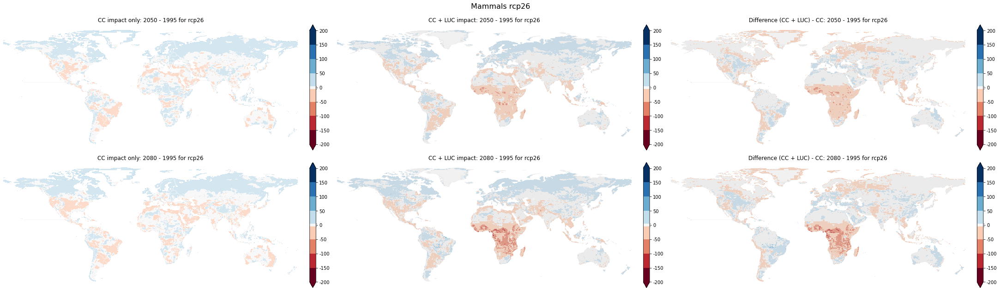

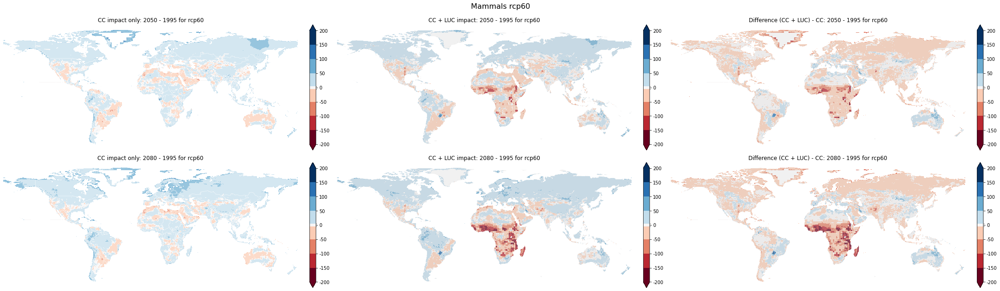

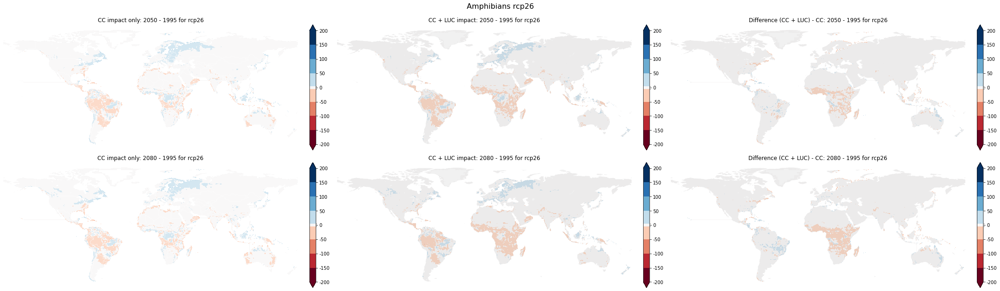

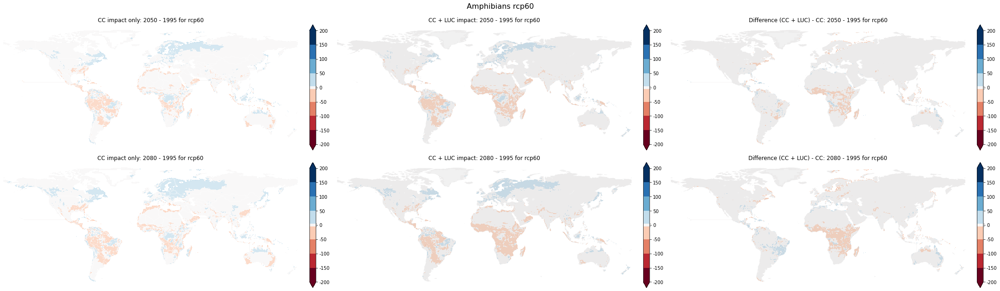

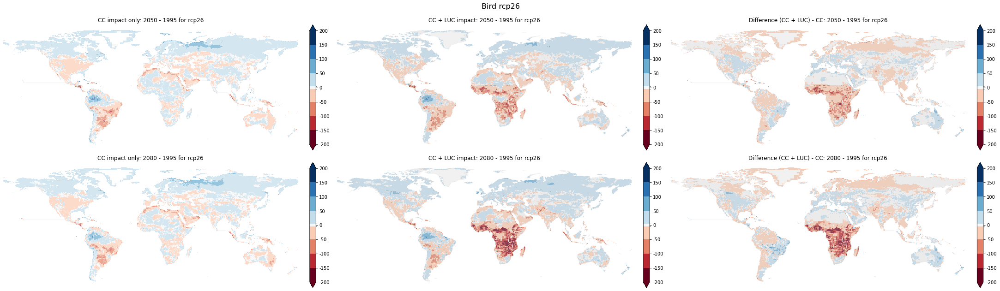

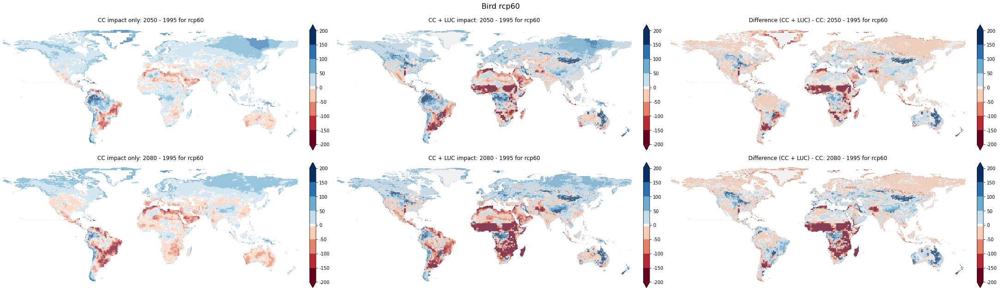

In [6]:
### SDM MODEL ENSEMBLE RCP26 ##### 

warnings.filterwarnings('ignore', category=UserWarning)

models =  ["GAM","GBM"]
taxas = ["Mammals","Amphibians","Bird"]
scenarios = ["rcp26","rcp60"]

model_names = ['GFDL-ESM2M', 'IPSL-CM5A-LR', 'HadGEM2-ES', 'MIROC5']
years = ['1845', '1990', '1995', '2009', '2010', '2020', '2026', '2032', '2048', '2050','2052', '2056', '2080', '2100', '2150', '2200', '2250']

#newvalue
for taxa in taxas:
    for scenario in scenarios:
        historical_time = 1146
        future_times = [35, 65]
        model_names = [ 'GFDL-ESM2M','IPSL-CM5A-LR', 'HadGEM2-ES', 'MIROC5']
        netcdf_path_format_future = "/storage/scratch/users/ch21o450/data/LandClim_Output/{}/{}/{}/{}/{}_[{}].nc"
        netcdf_path_format_hist = "/storage/scratch/users/ch21o450/data/LandClim_Output/{}/{}/EWEMBI/{}_[{}].nc"

        fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(30, 15), subplot_kw={'projection': ccrs.PlateCarree()}, layout="compressed")
        cmap = matplotlib.colors.ListedColormap(['white', 'green'])
        countries = gpd.read_file(gpd.datasets.get_path("naturalearth_lowres"))

        plot_idx = 0
        year_indices = {1146: '1995', 35: '2050', 65: '2080', 85: '2100'}

        # create empty arrays for storing the results
        diff_value_bin_combined = np.zeros([360, 720])
        diff_sum_bin_combined = np.zeros([360, 720])
        diff_combined = np.zeros([360, 720])


        for future_time in future_times:
            diff_value_bin_models = []
            diff_sum_bin_models = []
            diff_models = []

            for model in models:
                newvalue_hist = f"/storage/homefs/ch21o450/scripts/BioScenComb/intermediate_results/{taxa}_{model}_{historical_time}_{scenario}_species_count_per_SCDM_00th_mean_value_bin_future.nc"

                sumbin_hist = f"/storage/homefs/ch21o450/scripts/BioScenComb/intermediate_results/{taxa}_{model}_{historical_time}_{scenario}_species_count_per_SCDM_00th_mean_sum_bin_future.nc"


                mean_value_bin_hist = xr.open_dataset(newvalue_hist,decode_times=False).to_array()
                mean_sum_bin_hist = xr.open_dataset(sumbin_hist,decode_times=False).to_array()
                #mean_value_bin_hist = mean_value_bin_hist.isel(variable=0)
                #mean_sum_bin_hist = mean_sum_bin_hist.isel(variable=0)

                newvalue_fut = f"/storage/homefs/ch21o450/scripts/BioScenComb/intermediate_results/{taxa}_{model}_{future_time}_{scenario}_species_count_per_SCDM_00th_mean_value_bin_future.nc"

                sumbin_fut = f"/storage/homefs/ch21o450/scripts/BioScenComb/intermediate_results/{taxa}_{model}_{future_time}_{scenario}_species_count_per_SCDM_00th_mean_sum_bin_future.nc"

                mean_value_bin_future = xr.open_dataset(newvalue_fut,decode_times=False).to_array()
                mean_sum_bin_future = xr.open_dataset(sumbin_fut,decode_times=False).to_array()
                mean_sum_bin_future = mean_sum_bin_future.isel(variable=0)

                # Calculate the differences
                diff_value_bin = mean_value_bin_future - mean_value_bin_hist
                diff_sum_bin = mean_sum_bin_future - mean_sum_bin_hist
                diff = diff_sum_bin - diff_value_bin

                # append the differences to the model-specific lists
                diff_value_bin_models.append(diff_value_bin)
                diff_sum_bin_models.append(diff_sum_bin)
                diff_models.append(diff)

            # Calculate the ensemble mean outside of the inner loop
            diff_value_bin_ensemble = xr.concat(diff_value_bin_models, dim="ensemble").mean(dim="ensemble")
            diff_sum_bin_ensemble = xr.concat(diff_sum_bin_models, dim="ensemble").mean(dim="ensemble")

            diff_value_bin_ensemble = diff_value_bin_ensemble.isel(variable=0)
            diff_sum_bin_ensemble = diff_sum_bin_ensemble.isel(variable=0)
            diff_ensemble = diff_sum_bin_ensemble - diff_value_bin_ensemble

            # Create three subplots for each future time and scenario
            if plot_idx >= len(axes.flatten()):
                break
            ax1 = axes.flatten()[plot_idx]
            ax2 = axes.flatten()[plot_idx + 1]
            ax3 = axes.flatten()[plot_idx + 2]

            labels = ['a', 'b', 'c']
            # Define the colormap and the range of values for the colorbar
            vmin_b = diff_sum_bin.min().values
            vmax_b = diff_sum_bin.max().values

            cmap = plt.colormaps['RdBu']
            boundaries = [-200, -150, -100, -50,-5,5,50, 100, 150, 200] # Adjust these values according to your data
            norm = BoundaryNorm(boundaries, cmap.N)

            # Plot the ensemble mean difference for each panel
            im1 = ax1.pcolormesh(diff_value_bin_ensemble['lon'].values, diff_value_bin_ensemble['lat'].values, np.where(diff_value_bin_ensemble.values != 0, diff_value_bin_ensemble.values, np.nan), transform=ccrs.PlateCarree(), cmap=cmap, norm=norm)

            countries.plot(ax=ax1, color="white", zorder=1, alpha=0.3)
            ax1.set_title(f"CC impact only: {year_indices[future_time]} - 1995 for {scenario}",loc='center')


            ax1.axis('off')
            ax1.set_extent((-180,180,-63,90))
            ax1.add_feature(cfeature.BORDERS,color='white',linewidth=0.5)

            ticks_b = np.array( [-200, -150, -100, -50,0,50, 100, 150, 200])
            tick_labels = [str(int(tick)) for tick in ticks_b]

            cbar1 = plt.colorbar(im1, ax=ax1, fraction=0.024, pad=0.04, spacing='proportional', ticks=ticks_b,extend='both')
            cbar1.set_ticklabels(tick_labels)



            im2 = ax2.pcolormesh(diff_sum_bin_ensemble['lon'].values, diff_sum_bin_ensemble['lat'].values,  np.where(diff_sum_bin_ensemble.values != 0, diff_sum_bin_ensemble.values, np.nan), transform=ccrs.PlateCarree(), cmap=cmap, norm=norm)

            countries.plot(ax=ax2, color="lightgray", zorder=1, alpha=0.3)

            ax2.set_title(f"CC + LUC impact: {year_indices[future_time]} - 1995 for {scenario}",loc='center')

            ax2.axis('off')
            ax2.set_extent((-180,180,-63,90))
            cbar2 = plt.colorbar(im2, ax=ax2, fraction=0.024, pad=0.04, spacing='proportional', ticks=ticks_b,extend='both')
            cbar2.set_ticklabels(tick_labels)


            # ------------------------------------------------
            # Panel c 


            boundaries = [-200, -150, -100, -50,-5,5,50, 100, 150, 200] # Adjust these values according to your data
            norm = BoundaryNorm(boundaries, cmap.N)
            cmap = plt.colormaps['RdBu']

            im3 = ax3.pcolormesh(diff_ensemble['lon'].values, diff_ensemble['lat'].values,  np.where(diff_ensemble.values != 0, diff_ensemble.values, np.nan), transform=ccrs.PlateCarree(), cmap=cmap, norm=norm)

            countries.plot(ax=ax3, color="lightgray", zorder=1, alpha=0.3)
            ax3.set_title(f"Difference (CC + LUC) - CC: {year_indices[future_time]} - 1995 for {scenario}",loc='center')

            ax3.axis('off')
            ax3.set_extent((-180,180,-63,90))

            ticks_b = np.array( [-200, -150, -100, -50,0,50, 100, 150, 200])
            tick_labels = [str(int(tick)) for tick in ticks_b]

            cbar3 = plt.colorbar(im3, ax=ax3, fraction=0.024, pad=0.04, spacing='proportional', ticks=ticks_b, extend='both')
            cbar3.set_ticklabels(tick_labels)
            # Increase the plot index by 3 to move to the next triplet of subplots
            plot_idx += 3


        plt.suptitle(taxa +" "+ scenario , size=16, y=0.8)
        plt.savefig("/storage/homefs/ch21o450/scripts/BioScenComb/plots/species_richness_lu_binary" + taxa +  "_" + scenario)

    #plt.show() 


### overall species richness  all taxa combined

/software.el7/software/SciPy-bundle/2021.05-foss-2021a/lib/python3.9/site-packages/numpy/core/_methods.py:261: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/software.el7/software/SciPy-bundle/2021.05-foss-2021a/lib/python3.9/site-packages/numpy/core/_methods.py:221: RuntimeWarning: invalid value encountered in true_divide
  arrmean = um.true_divide(arrmean, div, out=arrmean, casting='unsafe',
/software.el7/software/SciPy-bundle/2021.05-foss-2021a/lib/python3.9/site-packages/numpy/core/_methods.py:253: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Standard Deviation of Percentage Changes: nan%


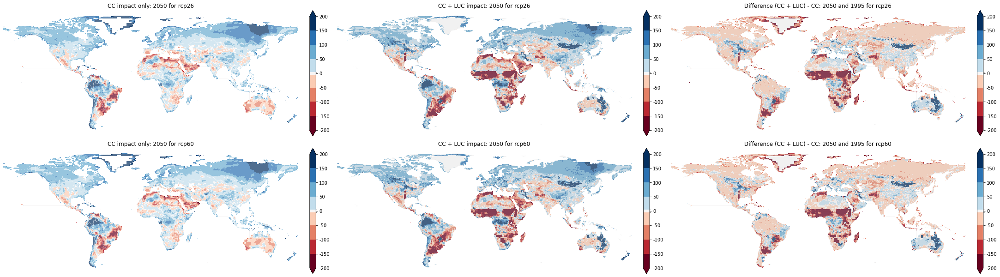

In [3]:
### SDM MODEL ENSEMBLE RCP26 ##### 

warnings.filterwarnings('ignore', category=UserWarning)

models =  ["GAM","GBM"]
taxas = ["Bird","Mammals","Amphibians"]
scenarios = ["rcp26","rcp60"]

model_names = ['GFDL-ESM2M', 'IPSL-CM5A-LR', 'HadGEM2-ES', 'MIROC5']
years = ['1845', '1990', '1995', '2009', '2010', '2020', '2026', '2032', '2048', '2050','2052', '2056', '2080', '2100', '2150', '2200', '2250']

fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(30, 15), subplot_kw={'projection': ccrs.PlateCarree()}, layout="compressed")
cmap = matplotlib.colors.ListedColormap(['white', 'green'])
countries = gpd.read_file(gpd.datasets.get_path("naturalearth_lowres"))

plot_idx = 0

year_indices = {1146: '1995', 35: '2050', 65: '2080', 85: '2100'}
# Create empty arrays for storing the results for each taxa separately
diff_value_bin_combined_per_taxa = {}
diff_sum_bin_combined_per_taxa = {}
diff_combined_per_taxa = {}

for taxa in taxas:
    diff_value_bin_combined_per_taxa[taxa] = np.zeros([360, 720])
    diff_sum_bin_combined_per_taxa[taxa] = np.zeros([360, 720])
    diff_combined_per_taxa[taxa] = np.zeros([360, 720])

for taxa in taxas:
    for scenario in scenarios:
        historical_time = 1146
        future_times = [35]
        netcdf_path_format_future = "/storage/scratch/users/ch21o450/data/LandClim_Output/{}/{}/{}/{}/{}_[{}].nc"
        netcdf_path_format_hist = "/storage/scratch/users/ch21o450/data/LandClim_Output/{}/{}/EWEMBI/{}_[{}].nc"

        year_indices = {1146: '1995', 35: '2050', 65: '2080', 85: '2100'}

        for future_time in future_times:
            diff_value_bin_models = []
            diff_sum_bin_models = []
            diff_models = []
            percent_changes = []


            for model in models:
                newvalue_hist = f"/storage/homefs/ch21o450/scripts/BioScenComb/intermediate_results/{taxa}_{model}_{historical_time}_{scenario}_species_count_per_SCDM_00th_mean_value_bin_future.nc"
                sumbin_hist = f"/storage/homefs/ch21o450/scripts/BioScenComb/intermediate_results/{taxa}_{model}_{historical_time}_{scenario}_species_count_per_SCDM_00th_mean_sum_bin_future.nc"

                mean_value_bin_hist = xr.open_dataset(newvalue_hist, decode_times=False).to_array()
                mean_sum_bin_hist = xr.open_dataset(sumbin_hist, decode_times=False).to_array()

                newvalue_fut = f"/storage/homefs/ch21o450/scripts/BioScenComb/intermediate_results/{taxa}_{model}_{future_time}_{scenario}_species_count_per_SCDM_00th_mean_value_bin_future.nc"
                sumbin_fut = f"/storage/homefs/ch21o450/scripts/BioScenComb/intermediate_results/{taxa}_{model}_{future_time}_{scenario}_species_count_per_SCDM_00th_mean_sum_bin_future.nc"

                mean_value_bin_future = xr.open_dataset(newvalue_fut, decode_times=False).to_array()
                mean_sum_bin_future = xr.open_dataset(sumbin_fut, decode_times=False).to_array()
                mean_sum_bin_future = mean_sum_bin_future.isel(variable=0)

                # Calculate the differences
                diff_value_bin = mean_value_bin_future - mean_value_bin_hist
                diff_sum_bin = mean_sum_bin_future - mean_sum_bin_hist
                diff = diff_sum_bin - diff_value_bin
                change_percent = ((diff_sum_bin - diff_value_bin) / (diff_value_bin)) * 100  # added small value to avoid division by zero
                percent_changes.append(change_percent)

                # append the differences to the model-specific lists
                diff_value_bin_models.append(diff_value_bin)
                diff_sum_bin_models.append(diff_sum_bin)
                diff_models.append(diff)

            # Calculate the ensemble mean outside of the inner loop
            diff_value_bin_ensemble = xr.concat(diff_value_bin_models, dim="ensemble").mean(dim="ensemble")
            diff_sum_bin_ensemble = xr.concat(diff_sum_bin_models, dim="ensemble").mean(dim="ensemble")

            diff_value_bin_ensemble = diff_value_bin_ensemble.isel(variable=0)
            diff_sum_bin_ensemble = diff_sum_bin_ensemble.isel(variable=0)
            diff_ensemble = diff_sum_bin_ensemble - diff_value_bin_ensemble

            # Append the ensemble mean to the overall results for this taxa
            diff_value_bin_combined_per_taxa[taxa] = diff_value_bin_ensemble
            diff_sum_bin_combined_per_taxa[taxa] = diff_sum_bin_ensemble
            diff_combined_per_taxa[taxa] = diff_ensemble

# Calculate the overall species richness sum over all taxa
diff_value_bin_combined = sum(diff_value_bin_combined_per_taxa.values())
diff_sum_bin_combined = sum(diff_sum_bin_combined_per_taxa.values())
diff_combined = sum(diff_combined_per_taxa.values())

std_dev_percent_changes = np.std(percent_changes)
print(f"Standard Deviation of Percentage Changes: {std_dev_percent_changes:.2f}%")


for scenario in scenarios:
        
    diff_newvalue= diff_value_bin_combined
    diff_sumbin = diff_sum_bin_combined
    diff = diff_combined
    # Create three subplots for each future time and scenario
    if plot_idx >= len(axes.flatten()):
        break
    ax1 = axes.flatten()[plot_idx]
    ax2 = axes.flatten()[plot_idx + 1]
    ax3 = axes.flatten()[plot_idx + 2]

    labels = ['a', 'b', 'c']
    # Define the colormap and the range of values for the colorbar
    vmin_b = diff_sum_bin.min().values
    vmax_b = diff_sum_bin.max().values

    cmap = plt.colormaps['RdBu']
    boundaries = [-200, -150, -100, -50,-5,5,50, 100, 150, 200] # Adjust these values according to your data
    norm = BoundaryNorm(boundaries, cmap.N)

    # Plot the ensemble mean difference for each panel
    im1 = ax1.pcolormesh(diff_newvalue['lon'].values, diff_newvalue['lat'].values, np.where(diff_newvalue.values != 0, diff_newvalue.values, np.nan), transform=ccrs.PlateCarree(), cmap=cmap, norm=norm)

    countries.plot(ax=ax1, color="white", zorder=1, alpha=0.3)
    ax1.set_title(f"CC impact only: {year_indices[future_time]} for {scenario}",loc='center')


    ax1.axis('off')
    ax1.set_extent((-180,180,-63,90))
    ax1.add_feature(cfeature.BORDERS,color='white',linewidth=0.5)

    ticks_b = np.array( [-200, -150, -100, -50,0,50, 100, 150, 200])
    tick_labels = [str(int(tick)) for tick in ticks_b]

    cbar1 = plt.colorbar(im1, ax=ax1, fraction=0.024, pad=0.04, spacing='proportional', ticks=ticks_b,extend='both')
    cbar1.set_ticklabels(tick_labels)



    im2 = ax2.pcolormesh(diff_sumbin['lon'].values, diff_sumbin['lat'].values,  np.where(diff_sumbin.values != 0, diff_sumbin.values, np.nan), transform=ccrs.PlateCarree(), cmap=cmap, norm=norm)

    countries.plot(ax=ax2, color="lightgray", zorder=1, alpha=0.3)

    ax2.set_title(f"CC + LUC impact: {year_indices[future_time]} for {scenario}",loc='center')

    ax2.axis('off')
    ax2.set_extent((-180,180,-63,90))
    cbar2 = plt.colorbar(im2, ax=ax2, fraction=0.024, pad=0.04, spacing='proportional', ticks=ticks_b,extend='both')
    cbar2.set_ticklabels(tick_labels)


    # ------------------------------------------------
    # Panel c 


    boundaries = [-200, -150, -100, -50,-5,5,50, 100, 150, 200] # Adjust these values according to your data
    norm = BoundaryNorm(boundaries, cmap.N)
    cmap = plt.colormaps['RdBu']

    im3 = ax3.pcolormesh(diff['lon'].values, diff['lat'].values,  np.where(diff.values != 0, diff.values, np.nan), transform=ccrs.PlateCarree(), cmap=cmap, norm=norm)

    countries.plot(ax=ax3, color="lightgray", zorder=1, alpha=0.3)
    ax3.set_title(f"Difference (CC + LUC) - CC: {year_indices[future_time]} and 1995 for {scenario}",loc='center')

    ax3.axis('off')
    ax3.set_extent((-180,180,-63,90))

    ticks_b = np.array( [-200, -150, -100, -50,0,50, 100, 150, 200])
    tick_labels = [str(int(tick)) for tick in ticks_b]

    cbar3 = plt.colorbar(im3, ax=ax3, fraction=0.024, pad=0.04, spacing='proportional', ticks=ticks_b, extend='both')
    cbar3.set_ticklabels(tick_labels)
    # Increase the plot index by 3 to move to the next triplet of subplots
    plot_idx += 3


#plt.suptitle(future_time , size=16, y=0.8)
#plt.savefig("/storage/homefs/ch21o450/scripts/BioScenComb/plots/species_richness_2080")

#plt.show() 


In [36]:
cdiff_sum_bin

NameError: name 'cdiff_sum_bin' is not defined

In [26]:
loss_sum = diff.where(diff < 0).sum().values
gain_sum = diff.where(diff > 0).sum().values
initial_state = mean_sum_bin_hist.sum().values
loss_percentage = (abs(loss_sum) / initial_state) * 100
gain_percentage = (gain_sum / initial_state) * 100
print(f"Total loss: {loss_sum} which is {loss_percentage:.2f}% of the total.")
print(f"Total gain: {gain_sum} which is {gain_percentage:.2f}% of the total.")


Total loss: -2221284.8480123384 which is 153.49% of the total.
Total gain: 791749.6354830224 which is 54.71% of the total.


In [15]:
total_cells_cells

array(259200)

In [12]:
loss_sum

array(-2221284.84801234)

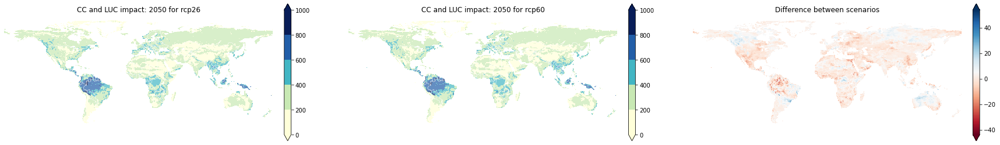

In [63]:
import warnings
import matplotlib.pyplot as plt
import matplotlib.colors
import geopandas as gpd
import xarray as xr
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from matplotlib.colors import BoundaryNorm

warnings.filterwarnings('ignore', category=UserWarning)

# Define constants
models = ["GAM", "GBM"]
taxas = [ "Mammals", "Amphibians","Bird"]
scenarios = ["rcp26","rcp60"]
model_names = ['GFDL-ESM2M', 'IPSL-CM5A-LR', 'HadGEM2-ES', 'MIROC5']
year_indices = {1146: '1995', 35: '2050', 65: '2080', 85: '2100'}

# Setup plot
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(30, 15), subplot_kw={'projection': ccrs.PlateCarree()})
countries = gpd.read_file(gpd.datasets.get_path("naturalearth_lowres"))

diff_combined_all_scenarios = []
# Extract and plot data for each scenario
for idx, scenario in enumerate(scenarios):
    diff_value_bin_combined_per_taxa = {taxa: np.zeros([360, 720]) for taxa in taxas}
    diff_sum_bin_combined_per_taxa = {taxa: np.zeros([360, 720]) for taxa in taxas}
    diff_combined_per_taxa = {taxa: np.zeros([360, 720]) for taxa in taxas}

    for taxa in taxas:
        historical_time = 1146
        future_times = [35]

        for future_time in future_times:
            diff_value_bin_models = []
            diff_sum_bin_models = []
            diff_models = []

            for model in models:
                newvalue_hist = f"/storage/scratch/users/ch21o450/data/intermediate_results/{taxa}_{model}_{historical_time}_{scenario}_species_count_per_SCDM_00th_mean_value_bin_future.nc"
                sumbin_hist = f"/storage/scratch/users/ch21o450/data/intermediate_results/{taxa}_{model}_{historical_time}_{scenario}_species_count_per_SCDM_00th_mean_sum_bin_future.nc"

                mean_value_bin_hist = xr.open_dataset(newvalue_hist, decode_times=False).to_array()
                mean_sum_bin_hist = xr.open_dataset(sumbin_hist, decode_times=False).to_array()

                newvalue_fut = f"/storage/scratch/users/ch21o450/data/intermediate_results/{taxa}_{model}_{future_time}_{scenario}_species_count_per_SCDM_00th_mean_value_bin_future.nc"
                sumbin_fut = f"/storage/scratch/users/ch21o450/data/intermediate_results/{taxa}_{model}_{future_time}_{scenario}_species_count_per_SCDM_00th_mean_sum_bin_future.nc"

                mean_value_bin_future = xr.open_dataset(newvalue_fut, decode_times=False).to_array()
                mean_sum_bin_future = xr.open_dataset(sumbin_fut, decode_times=False).to_array()
                mean_sum_bin_future = mean_sum_bin_future.isel(variable=0)


                # Calculate the differences
                diff_value_bin = mean_value_bin_future 
                diff_sum_bin = mean_sum_bin_future 
                diff = diff_sum_bin - diff_value_bin

                # append the differences to the model-specific lists
                diff_value_bin_models.append(diff_value_bin)
                diff_sum_bin_models.append(diff_sum_bin)
                diff_models.append(diff)

            # Calculate the ensemble mean outside of the inner loop
            diff_value_bin_ensemble = xr.concat(diff_value_bin_models, dim="ensemble").mean(dim="ensemble")
            diff_sum_bin_ensemble = xr.concat(diff_sum_bin_models, dim="ensemble").mean(dim="ensemble")

            diff_value_bin_ensemble = diff_value_bin_ensemble.isel(variable=0)
            diff_sum_bin_ensemble = diff_sum_bin_ensemble
            diff_ensemble = diff_sum_bin_ensemble - diff_value_bin_ensemble

            # Append the ensemble mean to the overall results for this taxa
            diff_value_bin_combined_per_taxa[taxa] = diff_value_bin_ensemble
            diff_sum_bin_combined_per_taxa[taxa] = diff_sum_bin_ensemble
            diff_combined_per_taxa[taxa] = diff_ensemble

    # Calculate the overall species richness sum over all taxa
    diff_value_bin_combined = sum(diff_value_bin_combined_per_taxa.values())
    diff_sum_bin_combined = sum(diff_sum_bin_combined_per_taxa.values())
    diff_combined = sum(diff_combined_per_taxa.values())

    # Plot results
    ax = axes[idx]

    cmap = plt.cm.YlGnBu
    boundaries = [0, 200, 400, 600, 800, 1000]
    norm = BoundaryNorm(boundaries, cmap.N)

    im = ax.pcolormesh(diff_sum_bin_combined['lon'].values, diff_sum_bin_combined['lat'].values, np.where(diff_sum_bin_combined.values != 0, diff_sum_bin_combined.values, np.nan), transform=ccrs.PlateCarree(), cmap=cmap, norm=norm)
    
    countries.plot(ax=ax, color="white", zorder=1, alpha=0.3)
    ax.set_title(f"CC and LUC impact: 2050 for {scenario}", loc='center')

    ax.axis('off')
    ax.set_extent((-180, 180, -63, 90))
    ax.add_feature(cfeature.BORDERS, color='white', linewidth=0.5)

    ticks = np.array( [0, 200, 400, 600, 800, 1000])
    tick_labels = [str(int(tick)) for tick in ticks]

    cbar = plt.colorbar(im, ax=ax, fraction=0.024, pad=0.04, spacing='proportional', ticks=ticks, extend='both')
    cbar.set_ticklabels(tick_labels)
    
    diff_combined_all_scenarios.append(diff_sum_bin_combined)

# Compute the difference between the two scenarios
diff_between_scenarios = diff_combined_all_scenarios[1] - diff_combined_all_scenarios[0]

# Plot the difference in the third subplot
ax = axes[2]
im = ax.pcolormesh(diff_between_scenarios['lon'].values, 
                   diff_between_scenarios['lat'].values, 
                   np.where(diff_between_scenarios.values != 0, diff_between_scenarios.values, np.nan), 
                   transform=ccrs.PlateCarree(), cmap="RdBu")

countries.plot(ax=ax, color="white", zorder=1, alpha=0.3)
ax.set_title(f"Difference between scenarios", loc='center')

ax.axis('off')
ax.set_extent((-180, 180, -63, 90))
ax.add_feature(cfeature.BORDERS, color='white', linewidth=0.5)

#ticks = np.array( [0, 200, 400, 600, 800, 1000])
#tick_labels = [str(int(tick)) for tick in ticks]

cbar = plt.colorbar(im, ax=ax, fraction=0.024, pad=0.04, spacing='proportional', extend='both')
#cbar.set_ticklabels(tick_labels)


#plt.savefig("/storage/homefs/ch21o450/scripts/BioScenComb/plots/species_richness_2080")
plt.show()


In [80]:
t=diff_between_scenarios/diff_combined_all_scenarios[0]

In [85]:
percentage_diff = (diff_between_scenarios / diff_combined_all_scenarios[0]) * 100

In [87]:
with np.errstate(divide='ignore', invalid='ignore'):
    percentage_diff = (diff_between_scenarios / diff_combined_all_scenarios[0]) * 100
    percentage_diff = xr.where(diff_combined_all_scenarios[0] == 0, np.nan, percentage_diff)


In [88]:
percentage_diff.mean()

<xarray.DataArray ()>
array(3329232.40808478)
Coordinates:
    time      float64 35.0
    variable  <U7 'sum_bin'

In [46]:
diff*100

0.2734878966165012

In [39]:
perc.mean()

0.0027348789661650053

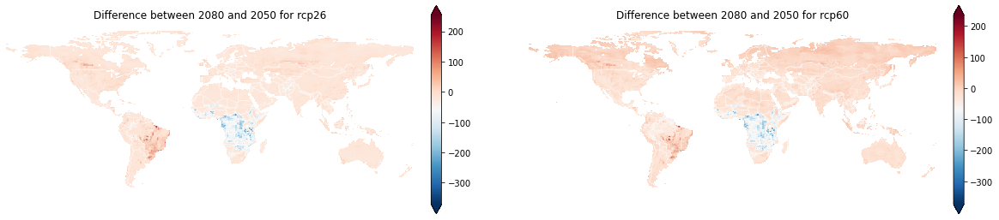

In [90]:
# ... [the beginning parts of your code remain unchanged]

# Setup plot
fig, axes = plt.subplots(nrows=1, ncols=len(scenarios), figsize=(20, 10), subplot_kw={'projection': ccrs.PlateCarree()})

for idx, scenario in enumerate(scenarios):
    diff_2080_2050_per_taxa = {taxa: np.zeros([360, 720]) for taxa in taxas}
    
    for taxa in taxas:
        newvalue_2050 = f"/storage/scratch/users/ch21o450/data/intermediate_results/{taxa}_{model}_35_{scenario}_species_count_per_SCDM_00th_mean_sum_bin_future.nc"
        newvalue_2080 = f"/storage/scratch/users/ch21o450/data/intermediate_results/{taxa}_{model}_65_{scenario}_species_count_per_SCDM_00th_mean_sum_bin_future.nc"

        mean_value_bin_2050 = xr.open_dataset(newvalue_2050, decode_times=False).to_array()
        mean_value_bin_2080 = xr.open_dataset(newvalue_2080, decode_times=False).to_array()

        diff_2080_2050 = mean_value_bin_2080 - mean_value_bin_2050
        diff_2080_2050_per_taxa[taxa] = diff_2080_2050.isel(variable=0)
    
    # Sum across all taxa
    diff_2080_2050_combined = sum(diff_2080_2050_per_taxa.values())
    
    # Plotting
    ax = axes[idx]

    cmap = plt.cm.RdBu_r
    im = ax.pcolormesh(diff_2080_2050_combined['lon'].values, diff_2080_2050_combined['lat'].values, np.where(diff_2080_2050_combined.values != 0, diff_2080_2050_combined.values, np.nan), transform=ccrs.PlateCarree(), cmap=cmap)

    countries.plot(ax=ax, color="white", zorder=1, alpha=0.3)
    ax.set_title(f"Difference between 2080 and 2050 for {scenario}", loc='center')

    ax.axis('off')
    ax.set_extent((-180, 180, -63, 90))
    ax.add_feature(cfeature.BORDERS, color='white', linewidth=0.5)

    cbar = plt.colorbar(im, ax=ax, fraction=0.024, pad=0.04, spacing='proportional', extend='both')

plt.show()


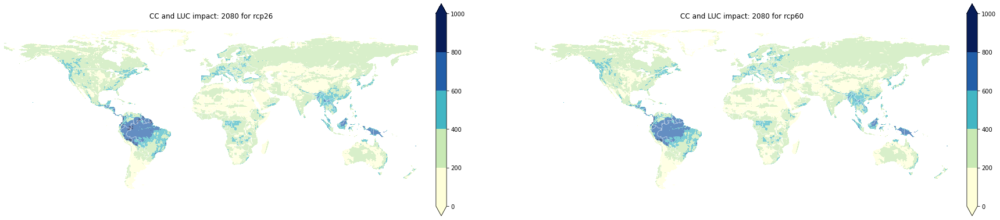

In [92]:
import warnings
import matplotlib.pyplot as plt
import matplotlib.colors
import geopandas as gpd
import xarray as xr
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from matplotlib.colors import BoundaryNorm

warnings.filterwarnings('ignore', category=UserWarning)

# Define constants
models = ["GAM", "GBM"]
taxas = [ "Mammals", "Amphibians","Bird"]
scenarios = ["rcp26","rcp60"]
model_names = ['GFDL-ESM2M', 'IPSL-CM5A-LR', 'HadGEM2-ES', 'MIROC5']
year_indices = {1146: '1995', 35: '2050', 65: '2080', 85: '2100'}

# Setup plot
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(30, 15), subplot_kw={'projection': ccrs.PlateCarree()})
countries = gpd.read_file(gpd.datasets.get_path("naturalearth_lowres"))


# Extract and plot data for each scenario
for idx, scenario in enumerate(scenarios):
    diff_value_bin_combined_per_taxa = {taxa: np.zeros([360, 720]) for taxa in taxas}
    diff_sum_bin_combined_per_taxa = {taxa: np.zeros([360, 720]) for taxa in taxas}
    diff_combined_per_taxa = {taxa: np.zeros([360, 720]) for taxa in taxas}

    for taxa in taxas:
        historical_time = 1146
        future_times = [65]

        for future_time in future_times:
            diff_value_bin_models = []
            diff_sum_bin_models = []
            diff_models = []

            for model in models:
                newvalue_hist = f"/storage/scratch/users/ch21o450/data/intermediate_results/{taxa}_{model}_{historical_time}_{scenario}_species_count_per_SCDM_00th_mean_value_bin_future.nc"
                sumbin_hist = f"/storage/scratch/users/ch21o450/data/intermediate_results/{taxa}_{model}_{historical_time}_{scenario}_species_count_per_SCDM_00th_mean_sum_bin_future.nc"

                mean_value_bin_hist = xr.open_dataset(newvalue_hist, decode_times=False).to_array()
                mean_sum_bin_hist = xr.open_dataset(sumbin_hist, decode_times=False).to_array()

                newvalue_fut = f"/storage/scratch/users/ch21o450/data/intermediate_results/{taxa}_{model}_{future_time}_{scenario}_species_count_per_SCDM_00th_mean_value_bin_future.nc"
                sumbin_fut = f"/storage/scratch/users/ch21o450/data/intermediate_results/{taxa}_{model}_{future_time}_{scenario}_species_count_per_SCDM_00th_mean_sum_bin_future.nc"

                mean_value_bin_future = xr.open_dataset(newvalue_fut, decode_times=False).to_array()
                mean_sum_bin_future = xr.open_dataset(sumbin_fut, decode_times=False).to_array()
                mean_sum_bin_future = mean_sum_bin_future.isel(variable=0)


                # Calculate the differences
                diff_value_bin = mean_value_bin_future 
                diff_sum_bin = mean_sum_bin_future 
                diff = diff_sum_bin - diff_value_bin

                # append the differences to the model-specific lists
                diff_value_bin_models.append(diff_value_bin)
                diff_sum_bin_models.append(diff_sum_bin)
                diff_models.append(diff)

            # Calculate the ensemble mean outside of the inner loop
            diff_value_bin_ensemble = xr.concat(diff_value_bin_models, dim="ensemble").mean(dim="ensemble")
            diff_sum_bin_ensemble = xr.concat(diff_sum_bin_models, dim="ensemble").mean(dim="ensemble")

            diff_value_bin_ensemble = diff_value_bin_ensemble.isel(variable=0)
            diff_sum_bin_ensemble = diff_sum_bin_ensemble
            diff_ensemble = diff_sum_bin_ensemble - diff_value_bin_ensemble

            # Append the ensemble mean to the overall results for this taxa
            diff_value_bin_combined_per_taxa[taxa] = diff_value_bin_ensemble
            diff_sum_bin_combined_per_taxa[taxa] = diff_sum_bin_ensemble
            diff_combined_per_taxa[taxa] = diff_ensemble

    # Calculate the overall species richness sum over all taxa
    diff_value_bin_combined = sum(diff_value_bin_combined_per_taxa.values())
    diff_sum_bin_combined = sum(diff_sum_bin_combined_per_taxa.values())
    diff_combined = sum(diff_combined_per_taxa.values())

    # Plot results
    ax = axes[idx]

    cmap = plt.cm.YlGnBu
    boundaries = [0, 200, 400, 600, 800, 1000]
    norm = BoundaryNorm(boundaries, cmap.N)

    im = ax.pcolormesh(diff_sum_bin_combined['lon'].values, diff_sum_bin_combined['lat'].values, np.where(diff_sum_bin_combined.values != 0, diff_sum_bin_combined.values, np.nan), transform=ccrs.PlateCarree(), cmap=cmap, norm=norm)
    
    countries.plot(ax=ax, color="white", zorder=1, alpha=0.3)
    ax.set_title(f"CC and LUC impact: 2080 for {scenario}", loc='center')

    ax.axis('off')
    ax.set_extent((-180, 180, -63, 90))
    ax.add_feature(cfeature.BORDERS, color='white', linewidth=0.5)

    ticks = np.array( [0, 200, 400, 600, 800, 1000])
    tick_labels = [str(int(tick)) for tick in ticks]

    cbar = plt.colorbar(im, ax=ax, fraction=0.024, pad=0.04, spacing='proportional', ticks=ticks, extend='both')
    cbar.set_ticklabels(tick_labels)
    
    diff_combined_all_scenarios.append(diff_value_bin_combined)



#plt.savefig("/storage/homefs/ch21o450/scripts/BioScenComb/plots/species_richness_2080")
plt.show()


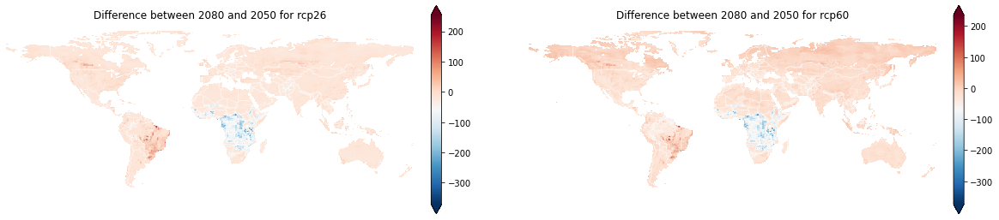

In [93]:
# ... [the beginning parts of your code remain unchanged]

# Setup plot
fig, axes = plt.subplots(nrows=1, ncols=len(scenarios), figsize=(20, 10), subplot_kw={'projection': ccrs.PlateCarree()})

for idx, scenario in enumerate(scenarios):
    diff_2080_2050_per_taxa = {taxa: np.zeros([360, 720]) for taxa in taxas}
    
    for taxa in taxas:
        newvalue_2050 = f"/storage/scratch/users/ch21o450/data/intermediate_results/{taxa}_{model}_35_{scenario}_species_count_per_SCDM_00th_mean_sum_bin_future.nc"
        newvalue_2080 = f"/storage/scratch/users/ch21o450/data/intermediate_results/{taxa}_{model}_65_{scenario}_species_count_per_SCDM_00th_mean_sum_bin_future.nc"

        mean_value_bin_2050 = xr.open_dataset(newvalue_2050, decode_times=False).to_array()
        mean_value_bin_2080 = xr.open_dataset(newvalue_2080, decode_times=False).to_array()

        diff_2080_2050 = mean_value_bin_2080 - mean_value_bin_2050
        diff_2080_2050_per_taxa[taxa] = diff_2080_2050.isel(variable=0)
    
    # Sum across all taxa
    diff_2080_2050_combined = sum(diff_2080_2050_per_taxa.values())
    
    # Plotting
    ax = axes[idx]

    cmap = plt.cm.RdBu_r
    im = ax.pcolormesh(diff_2080_2050_combined['lon'].values, diff_2080_2050_combined['lat'].values, np.where(diff_2080_2050_combined.values != 0, diff_2080_2050_combined.values, np.nan), transform=ccrs.PlateCarree(), cmap=cmap)

    countries.plot(ax=ax, color="white", zorder=1, alpha=0.3)
    ax.set_title(f"Difference between 2080 and 2050 for {scenario}", loc='center')

    ax.axis('off')
    ax.set_extent((-180, 180, -63, 90))
    ax.add_feature(cfeature.BORDERS, color='white', linewidth=0.5)

    cbar = plt.colorbar(im, ax=ax, fraction=0.024, pad=0.04, spacing='proportional', extend='both')

plt.show()


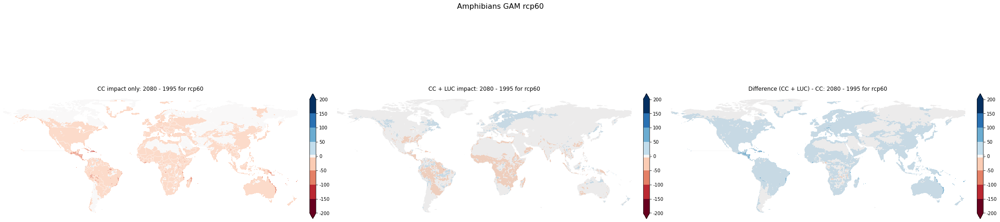

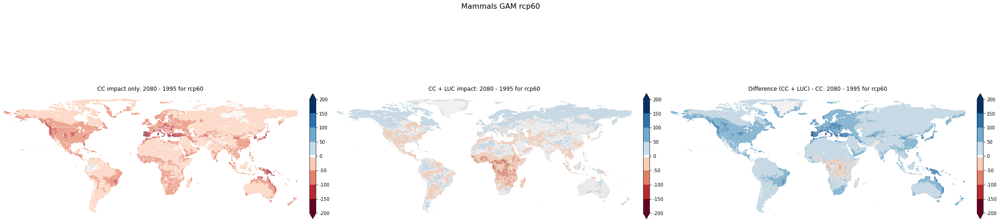

In [21]:
### SDM MODEL SDMs separately  ##### 

warnings.filterwarnings('ignore', category=UserWarning)

models = ["GAM"]
taxas = ["Amphibians","Mammals"]
scenarios = ["rcp60"]


countries = gpd.read_file(
              gpd.datasets.get_path("naturalearth_lowres"))

#newvalue
for taxa in taxas:
    for model in models:
        for scenario in scenarios:
            historical_time = 1146
            future_times = [ 65]
            model_names = [ 'GFDL-ESM2M','IPSL-CM5A-LR', 'HadGEM2-ES', 'MIROC5']
            netcdf_path_format_future = "/storage/scratch/users/ch21o450/data/LandClim_Output/{}/{}/{}/{}/{}_[{}].nc"
            netcdf_path_format_hist = "/storage/scratch/users/ch21o450/data/LandClim_Output/{}/{}/EWEMBI/{}_[{}].nc"

            fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(30, 15), subplot_kw={'projection': ccrs.PlateCarree()}, layout="compressed")


            plot_idx = 0
            year_indices = {1146: '1995', 35: '2050', 65: '2080', 85: '2100'}
            for future_time in future_times:

                newvalue_hist = f"/storage/scratch/users/ch21o450/data/SR/Dispersal2_{taxa}_{model}_{historical_time}_{scenario}_summedprobs_newvalue.nc"
                sumbin_hist = f"/storage/scratch/users/ch21o450/data/SR/{taxa}_{model}_{historical_time}_{scenario}_summedprobs_sum.nc"


                mean_value_bin_hist = xr.open_dataset(newvalue_hist, decode_times=False).to_array().isel(variable=0)
                mean_sum_bin_hist = xr.open_dataset(sumbin_hist, decode_times=False).to_array().isel(variable=0)


                mean_value_bin_hist = xr.open_dataset(newvalue_hist,decode_times=False).to_array()
                mean_sum_bin_hist = xr.open_dataset(sumbin_hist,decode_times=False).to_array()
                #mean_value_bin_hist = mean_value_bin_hist.isel(variable=0)
                #mean_sum_bin_hist = mean_sum_bin_hist.isel(variable=0)


                newvalue_fut = f"/storage/scratch/users/ch21o450/data/SR/Dispersal2_{taxa}_{model}_{future_time}_{scenario}_summedprobs_newvalue.nc"
                sumbin_fut = f"/storage/scratch/users/ch21o450/data/SR/{taxa}_{model}_{future_time}_{scenario}_summedprobs_sum.nc"
                mean_value_bin_future = xr.open_dataset(newvalue_fut,decode_times=False).to_array()
                mean_sum_bin_future = xr.open_dataset(sumbin_fut,decode_times=False).to_array()
                mean_sum_bin_future = mean_sum_bin_future.isel(variable=0)

                # Calculate the differences
                diff_value_bin = mean_value_bin_future - mean_value_bin_hist
                diff_sum_bin = mean_sum_bin_future - mean_sum_bin_hist
                diff = diff_sum_bin - diff_value_bin

                diff_value_bin_ensemble = diff_value_bin.isel(variable=0)
                diff_sum_bin_ensemble = diff_sum_bin.isel(variable=0)
                diff_ensemble = diff_sum_bin_ensemble - diff_value_bin_ensemble

                # Create three subplots for each future time and scenario
                if plot_idx >= len(axes.flatten()):
                    break
                ax1 = axes.flatten()[plot_idx]
                ax2 = axes.flatten()[plot_idx + 1]
                ax3 = axes.flatten()[plot_idx + 2]

                labels = ['a', 'b', 'c']
                # Define the colormap and the range of values for the colorbar
                vmin_b = diff_sum_bin.min().values
                vmax_b = diff_sum_bin.max().values

                cmap = plt.colormaps['RdBu']
                boundaries = [-200, -150, -100, -50,-5,5,50, 100, 150, 200] # Adjust these values according to your data
                norm = BoundaryNorm(boundaries, cmap.N)

                # Plot the ensemble mean difference for each panel
                im1 = ax1.pcolormesh(diff_value_bin_ensemble['lon'].values, diff_value_bin_ensemble['lat'].values, np.where(diff_value_bin_ensemble.values != 0, diff_value_bin_ensemble.values, np.nan), transform=ccrs.PlateCarree(), cmap=cmap, norm=norm)

                countries.plot(ax=ax1, color="white", zorder=1, alpha=0.3)
                ax1.set_title(f"CC impact only: {year_indices[future_time]} - 1995 for {scenario}",loc='center')


                ax1.axis('off')
                ax1.set_extent((-180,180,-63,90))
                ax1.add_feature(cfeature.BORDERS,color='white',linewidth=0.5)

                ticks_b = np.array( [-200, -150, -100, -50,0,50, 100, 150, 200])
                tick_labels = [str(int(tick)) for tick in ticks_b]

                cbar1 = plt.colorbar(im1, ax=ax1, fraction=0.024, pad=0.04, spacing='proportional', ticks=ticks_b,extend='both')
                cbar1.set_ticklabels(tick_labels)



                im2 = ax2.pcolormesh(diff_sum_bin_ensemble['lon'].values, diff_sum_bin_ensemble['lat'].values,  np.where(diff_sum_bin_ensemble.values != 0, diff_sum_bin_ensemble.values, np.nan), transform=ccrs.PlateCarree(), cmap=cmap, norm=norm)

                countries.plot(ax=ax2, color="lightgray", zorder=1, alpha=0.3)

                ax2.set_title(f"CC + LUC impact: {year_indices[future_time]} - 1995 for {scenario}",loc='center')

                ax2.axis('off')
                ax2.set_extent((-180,180,-63,90))
                cbar2 = plt.colorbar(im2, ax=ax2, fraction=0.024, pad=0.04, spacing='proportional', ticks=ticks_b,extend='both')
                cbar2.set_ticklabels(tick_labels)


                # ------------------------------------------------
                # Panel c 


                boundaries = [-200, -150, -100, -50,-5,5,50, 100, 150, 200] # Adjust these values according to your data
                norm = BoundaryNorm(boundaries, cmap.N)
                cmap = plt.colormaps['RdBu']

                im3 = ax3.pcolormesh(diff_ensemble['lon'].values, diff_ensemble['lat'].values,  np.where(diff_ensemble.values != 0, diff_ensemble.values, np.nan), transform=ccrs.PlateCarree(), cmap=cmap, norm=norm)

                countries.plot(ax=ax3, color="lightgray", zorder=1, alpha=0.3)
                ax3.set_title(f"Difference (CC + LUC) - CC: {year_indices[future_time]} - 1995 for {scenario}",loc='center')

                ax3.axis('off')
                ax3.set_extent((-180,180,-63,90))

                ticks_b = np.array( [-200, -150, -100, -50,0,50, 100, 150, 200])
                tick_labels = [str(int(tick)) for tick in ticks_b]

                cbar3 = plt.colorbar(im3, ax=ax3, fraction=0.024, pad=0.04, spacing='proportional', ticks=ticks_b, extend='both')
                cbar3.set_ticklabels(tick_labels)
                # Increase the plot index by 3 to move to the next triplet of subplots
                plot_idx += 3


            plt.suptitle(taxa +" "+ model + " " + scenario , size=16, y=0.8)
          #  plt.savefig("/storage/homefs/ch21o450/scripts/BioScenComb/annex_figures/species_richness_lu_binary_" + taxa + "_" + model + "_" + scenario)
            #plt.show() 


In [25]:
diff = mean_sum_bin_future - mean_sum_bin_hist

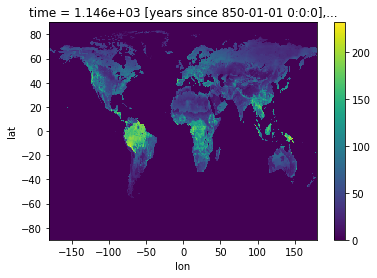

In [22]:
mean_sum_bin_hist.plot()

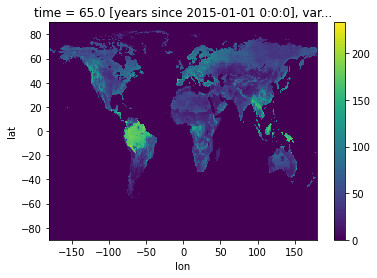

In [23]:
mean_sum_bin_future.plot()

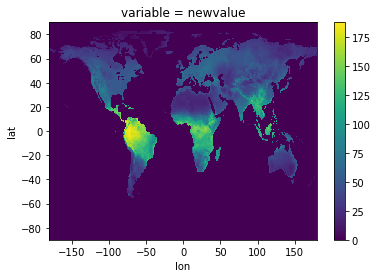

In [13]:
mean_value_bin_future.plot()

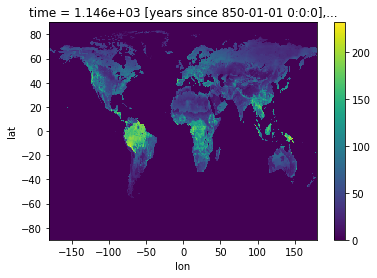

In [20]:
mean_sum_bin_hist.plot()

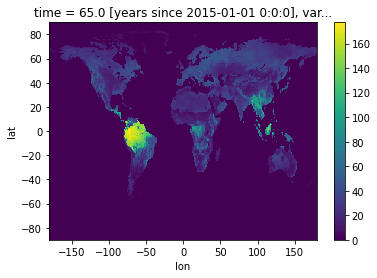

In [12]:
mean_sum_bin_future.plot()

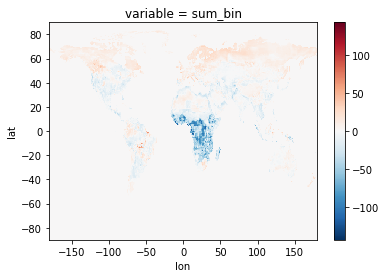

In [26]:
diff.plot()

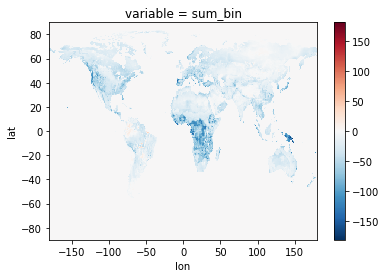

In [18]:
diff.plot()